In [1]:
import numpy as np
def generate_weighted_watts_strogatz_numpy(num_nodes, k_neighbors, p_rewire, seed=None):
    """
    Generates the weighted adjacency matrix for a Watts-Strogatz (Small-World) graph 
    where edge weights are uniformly distributed between 0 and 1.

    Args:
        num_nodes (int): The total number of nodes (N).
    
        k_neighbors (int): The number of neighbors each node connects to in the 
                           initial ring lattice (k, must be even).
        p_rewire (float): The probability of rewiring an edge (p), between 0 and 1.
        seed (int, optional): Seed for reproducibility.

    Returns:
        np.ndarray: The symmetric weighted adjacency matrix (float dtype).
    """
    if seed is not None:
        np.random.seed(seed)
    
    if k_neighbors % 2 != 0:
        raise ValueError("k_neighbors must be an even integer.")
        
    # Use float for weights
    adj_matrix = np.zeros((num_nodes, num_nodes), dtype=float)
    half_k = k_neighbors // 2
    
    # 1. Create the initial Weighted Ring Lattice
    for i in range(num_nodes):
        for j in range(1, half_k + 1):
            
            neighbor_right = (i + j) % num_nodes
            neighbor_left = (i - j) % num_nodes
            
            # Generate a random weight for the new edge (between 0 and 1)
            new_weight = np.random.uniform(0.1, 1.0) # Start weights slightly above 0 to differentiate from non-edges
            
            # Connect to the right neighbor
            if i != neighbor_right and adj_matrix[i, neighbor_right] == 0:
                adj_matrix[i, neighbor_right] = new_weight
                adj_matrix[neighbor_right, i] = new_weight # Symmetric
            
            # Connect to the left neighbor
            if i != neighbor_left and adj_matrix[i, neighbor_left] == 0:
                adj_matrix[i, neighbor_left] = new_weight
                adj_matrix[neighbor_left, i] = new_weight # Symmetric

    # 2. Randomly Rewire Edges
    
    # Iterate over upper triangular unique edges
    for i in range(num_nodes):
        for j in range(i + 1, num_nodes):
            # Check if an edge exists (weight > 0)
            if adj_matrix[i, j] > 0:
                
                if np.random.rand() < p_rewire:
                    
                    # a. Remove the existing edge (set weight to 0)
                    adj_matrix[i, j] = 0.0
                    adj_matrix[j, i] = 0.0
                    
                    # b. Find a new node 'w' to connect to
                    new_neighbor = i
                    # Keep trying until a new node is found that isn't i and isn't already connected
                    while new_neighbor == i or adj_matrix[i, new_neighbor] > 0:
                        new_neighbor = np.random.randint(0, num_nodes)
                        
                    # Generate a random weight for the new edge (between 0 and 1)
                    new_weight = np.random.uniform(0.1, 1.0)
                        
                    # c. Add the new edge (i, new_neighbor) with the new weight
                    adj_matrix[i, new_neighbor] = new_weight
                    adj_matrix[new_neighbor, i] = new_weight # Symmetric

    return adj_matrix

In [2]:
import numpy as np
import torch 
import networkx as nx

datasetPath = "data/France/transportsIDF/"

def read_matrix_from_csv_loadtxt(filepath, delimiter=',', dtype=float):
  """
  Reads a NumPy matrix from a CSV file using np.loadtxt().

  Args:
    filepath (str): The path to the CSV file.
    delimiter (str): The character separating values in the CSV file (default is comma).

  Returns:
    numpy.ndarray: The matrix read from the CSV file.
  """
  try:
    matrix = np.loadtxt(filepath, delimiter=delimiter, dtype=dtype)
    print(f"Successfully loaded matrix from {filepath} using np.loadtxt().")
    return matrix
  except FileNotFoundError:
    print(f"Error: The file '{filepath}' was not found.")
    return None
  except Exception as e:
    print(f"An error occurred while loading the file: {e}")
    return None

p_vectors_array = read_matrix_from_csv_loadtxt(datasetPath + "idf_attr_nnorm.csv")
adjacency_matrix = read_matrix_from_csv_loadtxt(datasetPath + "idf_adjacency_nnorm.csv")
names = read_matrix_from_csv_loadtxt(datasetPath + "idf_names_nnorm.csv", dtype=str)

# random_weights = np.random.normal(loc=0, scale=1, size=(50, 50))
# symmetric_matrix = random_weights + random_weights.T
# np.fill_diagonal(symmetric_matrix, 0)
# symmetric_matrix /= np.max(symmetric_matrix)
# symmetric_matrix = np.abs(symmetric_matrix)
# symmetric_matrix = np.where(symmetric_matrix < 0.15, 0.0, symmetric_matrix)
# adjacency_matrix = symmetric_matrix

# adjacency_matrix= generate_weighted_watts_strogatz_numpy(num_nodes=50, 
#                                                 k_neighbors=4, 
#                                                 p_rewire=0.1, 
#                                                 seed=42)
# p_vectors_array = p_vectors_array[0:50, :]
# names = names[0:50]


num_nodes = adjacency_matrix.shape[0]
dimP = 20

G = nx.from_numpy_array(adjacency_matrix)
G.remove_edges_from(nx.selfloop_edges(G)) # Remove self-loops

Successfully loaded matrix from data/France/transportsIDF/idf_attr_nnorm.csv using np.loadtxt().
Successfully loaded matrix from data/France/transportsIDF/idf_adjacency_nnorm.csv using np.loadtxt().
Successfully loaded matrix from data/France/transportsIDF/idf_names_nnorm.csv using np.loadtxt().


In [3]:
from scipy.spatial.distance import cosine # For cosine similarity

def compute_node_feature_assortativity(G, node_features):
    """
    Computes a node-level assortativity-like score based on d-dimensional features.
    For each node, it calculates the average similarity to its neighbors
    and compares it to the average similarity to all other nodes.

    Args:
        adj_matrix (np.ndarray): The adjacency matrix of the graph (N x N).
        node_features (np.ndarray): A (N x D) array where N is the number of nodes
                                     and D is the dimensionality of features.

    Returns:
        dict: A dictionary where keys are node IDs (integers) and values are
              their respective node-level assortativity scores.
              A higher positive score indicates more assortative mixing for that node.
              A negative score indicates disassortative mixing for that node.
    """
    num_nodes = G.number_of_nodes()
    if node_features.shape[0] != num_nodes:
        raise ValueError("Number of nodes in adjacency matrix and features must match.")

    # 1. Create a NetworkX graph from the adjacency matrix

    # Add features to nodes
    for i in range(num_nodes):
        G.nodes[i]['features'] = node_features[i]

    def vector_similarity(vec1, vec2):
        # Handle cases where vectors might be identical to avoid cosine(0,0) issues
        if np.array_equal(vec1, vec2):
            return 1.0
        return 1 - cosine(vec1, vec2)

    node_assortativity_scores = {}

    for node_id in G.nodes():
        node_feat = G.nodes[node_id]['features']
        neighbors = list(G.neighbors(node_id))

        if not neighbors:
            # A node with no neighbors can't have neighbor similarity
            node_assortativity_scores[node_id] = 0.0 # Or np.nan, depending on desired behavior
            continue

        # Calculate average similarity to neighbors
        neighbor_similarities = []
        for neighbor_id in neighbors:
            neighbor_feat = G.nodes[neighbor_id]['features']
            neighbor_similarities.append(vector_similarity(node_feat, neighbor_feat))
        avg_neighbor_similarity = np.mean(neighbor_similarities)

        # Calculate average similarity to all other nodes (baseline)
        all_other_node_similarities = []
        for other_node_id in G.nodes():
            if other_node_id != node_id: # Don't compare a node to itself
                other_node_feat = G.nodes[other_node_id]['features']
                all_other_node_similarities.append(vector_similarity(node_feat, other_node_feat))

        if not all_other_node_similarities: # Should only happen with single node graphs
            baseline_avg_similarity = avg_neighbor_similarity # Fallback if no other nodes
        else:
            baseline_avg_similarity = np.mean(all_other_node_similarities)

        # Compute the node's assortativity score
        score = avg_neighbor_similarity - baseline_avg_similarity
        node_assortativity_scores[node_id] = score

    return node_assortativity_scores

print("--- Assortativity by node ---")
node_scores_1 = compute_node_feature_assortativity(G, p_vectors_array)
# for node, score in node_scores_1.items():
#     print(f"Node {node}: {score:.3f}")
# Expected: Nodes within clusters (0,1,2 and 3,4,5) should have positive scores.

print("\n" + "="*40 + "\n")

--- Assortativity by node ---




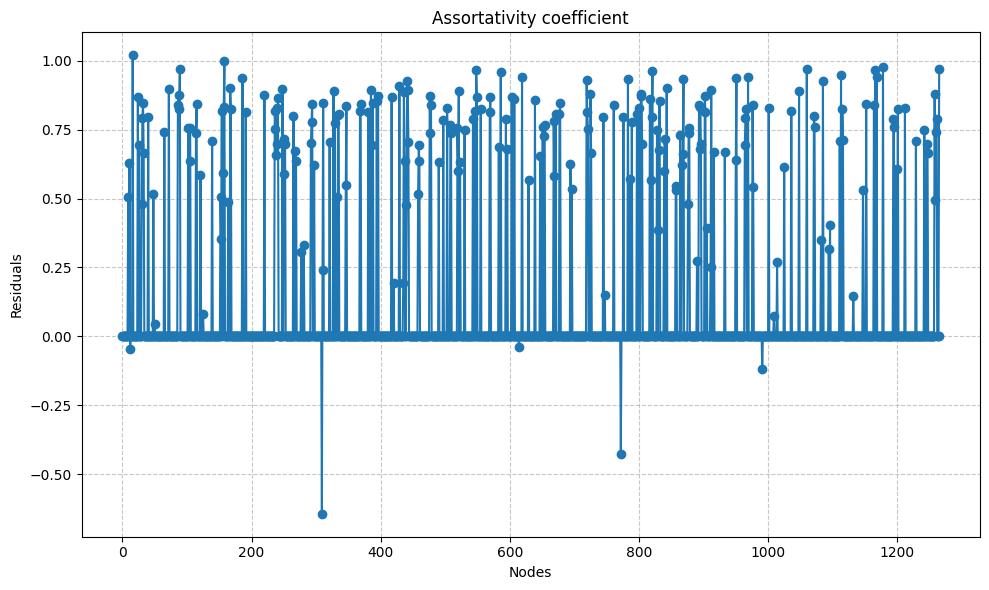

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6)) # Set the size of the plot for better readability

plt.plot(node_scores_1.values(), marker='o', linestyle='-')

# Add a horizontal line at y=0

# --- Customize the Plot ---
plt.xlabel('Nodes') # Label for the x-axis
plt.ylabel('Residuals') # Label for the y-axis, updated to reflect the ratio
plt.title('Assortativity coefficient') # Title of the plot, updated
plt.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping
plt.show()

In [5]:
from framework.trainFct import *
from torch_geometric.data import Data
from framework.visuals import *

latent_dim = 2
input_dim = dimP
batch_size = 256


dataset = []
data = Data(x=torch.tensor(p_vectors_array, dtype=torch.float), 
            edge_index=adj_matrix_to_edge_index(adjacency_matrix)[0], 
            edge_labels=adj_matrix_to_edge_index(adjacency_matrix)[1],
            adjacency_matrix=torch.tensor(adjacency_matrix))
dataset.append(data)

# Select a single graph to train on
single_graph = dataset[0]

# Wrap in list for compatibility with DataLoader-like expectations
single_graph_list = [single_graph]


/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:128: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: dlopen(/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so, 0x0006): Symbol not found: __ZN2at4_ops16div__Tensor_mode4callERNS_6TensorERKS2_NSt3__18optionalINS6_17basic_string_viewIcNS6_11char_traitsIcEEEEEE
  Referenced from: <2BF76774-0954-3F15-B7FE-8A5E5111D7DF> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so
  Expected in:     <A51C8C05-245A-3989-8D3C-9A6704422CA5> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:166: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/

In [6]:
dropout = 0
phase1_epochs = 1200
#phase1_epochs = 300
phase2_epochs = 500
#phase2_epochs = 100
lr_phase1 = 0.005
latent_dim = 2
device = "cuda" if torch.cuda.is_available() else "cpu"


encoder = MLPEncoder(
    input_dim=input_dim,
    hidden_dims=[96, 64],
    latent_dim=latent_dim,
    mlp_layers=2,
    dropout=0.2,
    activation=nn.ReLU()
)

node_decoder = NodeAttributeVariationalDecoder(
    latent_dim=latent_dim,
    output_dim=input_dim,
    #hidden_dims=[5000, 128],
    #hidden_dims=[2000, 128],
    hidden_dims=[128],
    dropout=dropout,
    activation=nn.ReLU(),
    loss_options= {
        "lambda_comp_variance": 100,
        "lambda_decoder_variance":20,
        "debug": False},
    clip_var = 30,
)

# Create KL annealing scheduler
kl_scheduler = KLAnnealingScheduler(
    anneal_start=0.0,
    #anneal_end=0.001,
    #anneal_end=0.8,
    anneal_end=1,
    anneal_steps=phase1_epochs * len(single_graph_list),
    anneal_type='sigmoid',
)

# Create initial model with only node decoder
model_phase1 = GraphVAE(
    encoder=encoder,
    decoders=[node_decoder],
    kl_scheduler=kl_scheduler,
    compute_latent_manifold=False,
)


=== Starting Phase 1: Training encoder with node feature reconstruction ===
Phase 1 - Epoch 10/1200 - Loss: 210.4066, KL: 26.2059 (weight: 0.0788), Node Recon: 208.3486
Phase 1 - Epoch 20/1200 - Loss: 118.5653, KL: 27.8416 (weight: 0.0819), Node Recon: 116.2935
Phase 1 - Epoch 30/1200 - Loss: 98.2132, KL: 26.6940 (weight: 0.0851), Node Recon: 95.9502
Phase 1 - Epoch 40/1200 - Loss: 79.2564, KL: 22.4060 (weight: 0.0884), Node Recon: 77.2832
Phase 1 - Epoch 50/1200 - Loss: 74.6448, KL: 19.9544 (weight: 0.0918), Node Recon: 72.8196
Phase 1 - Epoch 60/1200 - Loss: 65.9320, KL: 20.8941 (weight: 0.0953), Node Recon: 63.9473
Phase 1 - Epoch 70/1200 - Loss: 59.6958, KL: 19.8803 (weight: 0.0990), Node Recon: 57.7350
Phase 1 - Epoch 80/1200 - Loss: 55.0526, KL: 19.3510 (weight: 0.1028), Node Recon: 53.0711
Phase 1 - Epoch 90/1200 - Loss: 51.1483, KL: 20.0448 (weight: 0.1067), Node Recon: 49.0177
Phase 1 - Epoch 100/1200 - Loss: 45.7163, KL: 20.6012 (weight: 0.1107), Node Recon: 43.4437
Phase 1 -

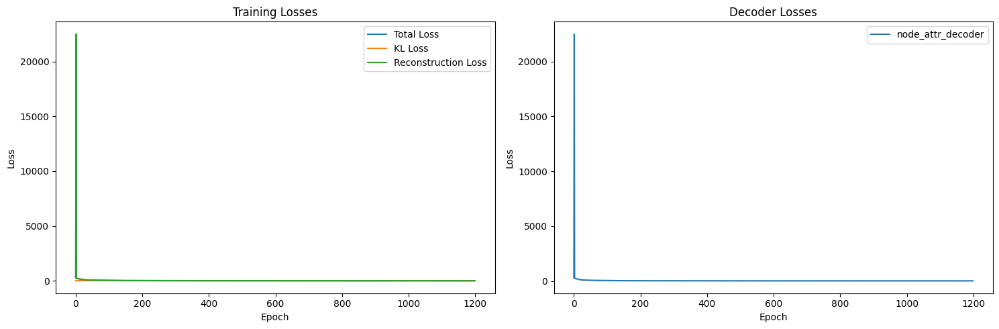

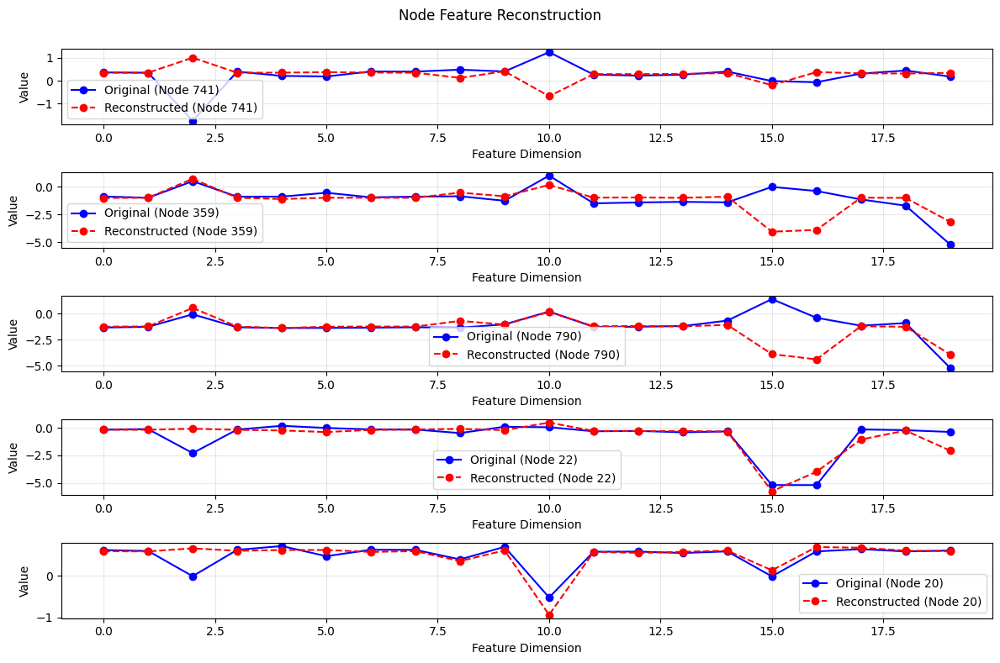

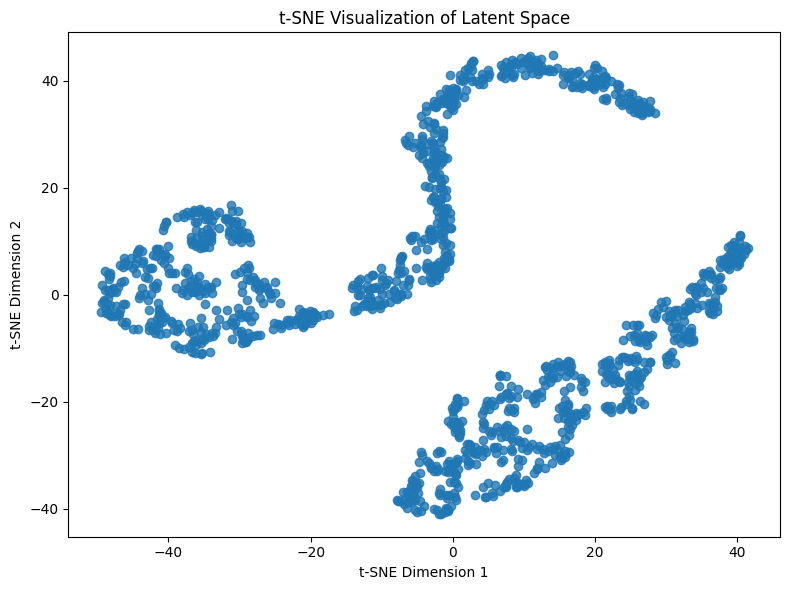

In [7]:
import os

if os.path.exists("model_phase1_reducedIDF.pth"):
    print("Loading pretrained model")
    model_phase1.load_state_dict(torch.load('model_phase1_reducedIDF.pth'))
else:
    print("=== Starting Phase 1: Training encoder with node feature reconstruction ===")

    # Phase 1 training
    history_phase1 = train_phase1(
        model=model_phase1,
        data_loader=single_graph_list,
        num_epochs=phase1_epochs,
        lr=lr_phase1,
        weight_decay=1e-5,
        verbose=True,
        device=device,
        loss_coefficient=1
    )

    print("\n=== Phase 1 Complete ===")

    torch.save(model_phase1.state_dict(), 'model_phase1_reducedIDF.pth')
    print("\n=== Phase 1 Saved ===")

    visualize_training(history_phase1)
    visualize_node_features_reconstruction(model_phase1, single_graph, sample_features=dimP)
    visualize_latent_space(model_phase1, [single_graph])


In [8]:
# model_phase1.eval()

# with torch.no_grad():
#     x = single_graph.x.to(device)
#     edge_index = single_graph.edge_index.to(device)
#     latent_mu = model_phase1.encode(x, edge_index=edge_index)

# latent_points = latent_mu[0]

In [9]:
# model_phase1.train_rbf_layer(
#     decoder_name="node_attr_decoder",
#     decoder_variance_target_name="node_features_logvar",
#     latent_samples=latent_points,
#     n_centers=24,  
#     a=2,
#     n_epochs= 20000,
#     lr=0.05,
#     force=True)

Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6935.89it/s]


Completed. Cached 10201 / 10201 points.


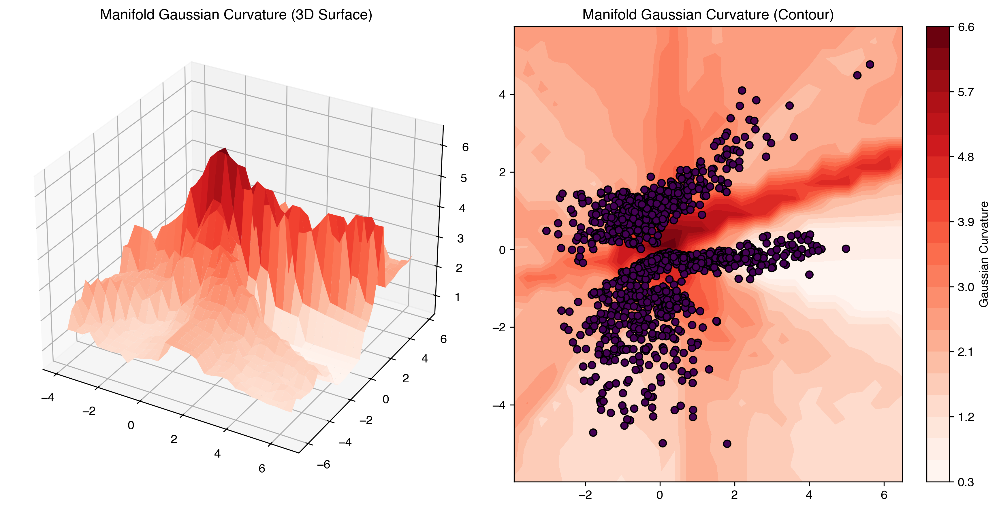

Calculating 800745 pairwise Riemannian distances using linear_interpolation_distance (batch mode)...


Computing distances in batches: 100%|██████████| 100094/100094 [00:15<00:00, 6425.62it/s]

Distance matrix calculation complete.


In [8]:
import copy
from framework.boundedManifold import BoundedManifold
from framework.torchVersions.distanceApproximations import DistanceApproximations
model_phase1 = model_phase1.to('cpu')
model_phase2 = copy.deepcopy(model_phase1)

model_phase1.eval()

with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu = model_phase1.encode(x, edge_index=edge_index)

latent_points = latent_mu[0]

model_phase1.set_compute_latent_manifold(True)
model_phase1.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase1.get_latent_manifold().compute_full_grid_metric_tensor()
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points)

with torch.no_grad():
    dists_phase1 = model_phase1.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                        DistanceApproximations.linear_interpolation_distance, 
                                                                                        batch_size=8, num_points=20)


In [11]:
# def pointwise_RBF_variance(z: torch.Tensor) -> float:
#     return model_phase1.get_rbf_estimate(z.float()).sum()

# def pointwise_RBF_entropy(z: torch.Tensor) -> float:
#     logvar = -0.5 * torch.log(model_phase1.get_rbf_estimate(z.float()).sum())
#     return  0.5 * ((1 + np.log(2 * np.pi)) + logvar.sum())

# model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_RBF_variance, "Precision",
#                                                          data_points=latent_points, resolution=60)

# model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_RBF_entropy, "RBF Entropy",
#                                                          data_points=latent_points, resolution=60)

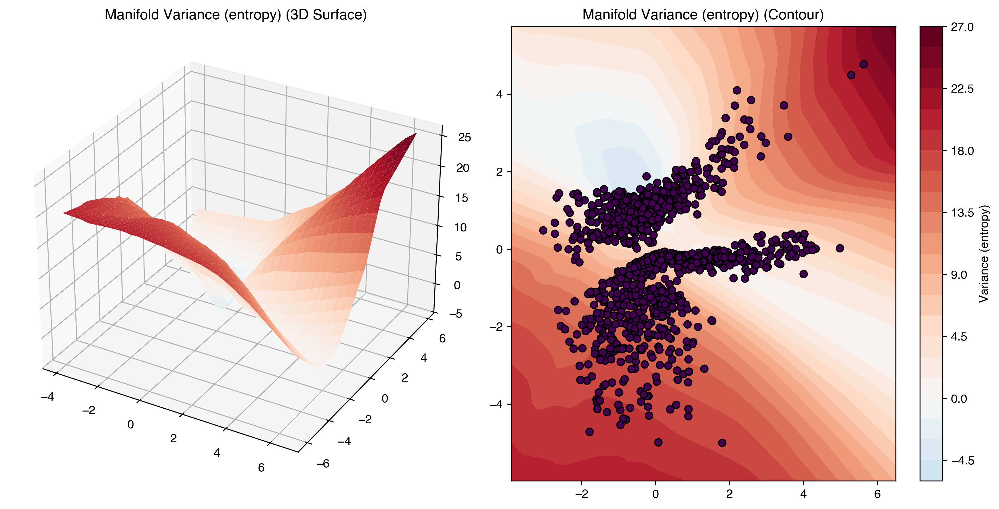

In [9]:
def pointwise_entropy(z: torch.Tensor) -> float:
    logvar = model_phase1.decode(z.float())["node_attr_decoder"]["node_features_logvar"]
    return  0.5 * (len(logvar) * (1 + np.log(2 * np.pi)) + logvar.sum())

# def pointwise_variance(z: torch.Tensor) -> float:
#     logvar = model_phase1.decode(z.float())["node_attr_decoder"]["node_features_logvar"]
#     return logvar.sum()

# model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_variance, "Variance (entropy)",
#                                                          data_points=latent_points, resolution=60)

model_phase1.get_latent_manifold().plot_on_manifold_grid(pointwise_entropy, "Variance (entropy)",
                                                         data_points=latent_points, resolution=60)

In [13]:
# mse = torch.zeros(num_nodes)
# entropies = torch.zeros(num_nodes)

# for i in range(num_nodes):
#     mse[i] = ((recon[i]-single_graph.x[i])**2).sum()
#     entropies[i] = pointwise_entropy(latent_points[i])
# model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=mse)

In [14]:
# k = 50
# topk_values, topk_indices = torch.topk(mse, k)
# names[topk_indices]

In [15]:
# import statsmodels.api as sm
# x1 = single_graph.x[:, 10].flatten().numpy().reshape(-1, 1)
# x2 = entropies.detach().flatten().numpy().reshape(-1, 1)

# y = mse.flatten().detach().numpy()

# model = sm.OLS(x1,y)
# results = model.fit()
# print(results.summary())
# model = sm.OLS(x2,y)
# results = model.fit()
# print(results.summary())

In [16]:
# i = int(np.random.random() * num_nodes)
# a = single_graph.x[i]
# a_r = model_phase1(single_graph.x[i].unsqueeze(0))


# colors = ['lightgray', 'red']
# from matplotlib.colors import ListedColormap
# cmap = ListedColormap(colors)

# fig = plt.figure(figsize=(18, 6))
# ax1 = fig.add_subplot(121)
# ax1.set_title(f'Recon test ({i} - {names[i]})')
# ax1.plot(a, marker='o', linestyle='-')
# ax1.plot(a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze(), marker='o', linestyle='-')
# ax1.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
# ax2 = fig.add_subplot(122)
# ax2.set_title(f'Points on Manifold')
# points_np = latent_points.detach().cpu().numpy()                
# labels_np = np.zeros(num_nodes)
# labels_np[i] = 1
# ax2.scatter(points_np[:, 0], points_np[:, 1], c=labels_np, cmap=cmap, edgecolors='k')
# plt.tight_layout()
# plt.show()

In [17]:
# for j in range(20):
#     weights = [p_vectors_array[i, j] for i in range(num_nodes)]

#     # 4. Plot the distribution of the weights (Histogram)
#     plt.figure(figsize=(10, 6))

#     # Plot a histogram of the weights
#     # Use 'density=True' to show probability density instead of count
#     plt.hist(weights, bins=20, edgecolor='black', alpha=0.7, density=True)


#     # Add labels and title
#     plt.title(f'Distribution of Edge Weights - i={j}')
#     plt.xlabel('Weight Value')
#     plt.ylabel('Density')
#     plt.grid(axis='y', alpha=0.5)
#     plt.show()


In [10]:
from framework.KLAnnealingScheduler import NoKLScheduler

lr_phase2 = 0.001
distance_mode = "linear_interpolation" # "linear_interpolation"

print("=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===")

model_phase2.set_compute_latent_manifold(True)
model_phase2.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase2.set_encoder_freeze(True)

#torch.autograd.set_detect_anomaly(True)

distance_decoder = ManifoldHeatKernelDecoder(
    distance_mode=distance_mode,
    latent_dim=latent_dim,
    #heat_time=torch.logspace(start=-1, end=2, steps=10).tolist(),  # Adjust for local vs global structure
    num_eigenvalues=500,
    num_integration_points=20,
    name="adj_decoder",
    max_ema_epochs=phase2_epochs,
    #ema_lag_factor=0.1
)

# Add to your GraphVAE model
model_phase2.add_decoder(distance_decoder)

# Set reference decoder (the node attribute decoder)
#model_phase2.get_decoder("adj_decoder").giveManifoldInstance(model_phase2.get_latent_manifold())
model_phase2.get_decoder("adj_decoder").giveVAEInstance(model_phase2)

# Reset KL scheduler for phase 2
model_phase2.kl_scheduler = NoKLScheduler()

torch.nn.utils.clip_grad_norm_(model_phase2.parameters(), 1)
#torch.autograd.set_detect_anomaly(True)

# Phase 2 training
history_phase2 = train_phase2(
    model=model_phase2,
    data_loader=single_graph_list,
    latent_points=latent_points,
    num_epochs=phase2_epochs,
    lr=lr_phase2,
    weight_decay=1e-5,
#    decoder_weights={"adj_decoder": -1, "node_attr_decoder":-1 },
    decoder_weights={"adj_decoder": 1, "node_attr_decoder":0.0 },
    verbose=True,
    device=device,
)

print("\n=== Phase 2 Complete ===")



=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===


Computing distances in batches:   0%|          | 0/100094 [00:00<?, ?it/s]

Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5629.79it/s]
/Users/aldric-l/Library/CloudStorage/OneDrive-Personnel/Documents/Scolarité - Aldric/Supérieur/ENS/M2 MVA/S3 Stage/Topological-GVAE/framework/geometry.py:441: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  min_log = float(torch.log10(torch.tensor(t_min)).item()) if t_min > 0.0 else clamp_min_log
/Users/aldric-l/Library/CloudStorage/OneDrive-Personnel/Documents/Scolarité - Aldric/Supérieur/ENS/M2 MVA/S3 Stage/Topological-GVAE/framework/geometry.py:442: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  max_log = float(torch.log10(torch.tensor(t_max)).item()) if t_max > 0.0 else clamp_max_log


Current sigma:  7.163673400878906 Selected sigma:  7.163673400878906
Selected heat times: tensor([ 0.0507,  0.0673,  0.0892,  0.1183,  0.1569,  0.2081,  0.2761,  0.3662,
         0.4857,  0.6441,  0.8544,  1.1332,  1.5030,  1.9935,  2.6441,  3.5070,
         4.6515,  6.1695,  8.1829, 10.8534])
Total Laplacian loss: 1300.363525 - With referent sigma: 1300.363525


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5385.35it/s]


Current sigma:  7.289423942565918 Selected sigma:  7.173733234405518
Total Laplacian loss: 1299.714233 - With referent sigma: 1299.678223


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5464.14it/s]


Current sigma:  7.292995452880859 Selected sigma:  7.183274745941162
Total Laplacian loss: 1299.711426 - With referent sigma: 1299.639771


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5421.06it/s]


Current sigma:  7.456696510314941 Selected sigma:  7.205148696899414
Total Laplacian loss: 1298.900269 - With referent sigma: 1298.726318


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5382.83it/s]


Current sigma:  7.522531032562256 Selected sigma:  7.230539321899414
Total Laplacian loss: 1298.347290 - With referent sigma: 1298.033936


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5379.13it/s]


Current sigma:  7.638856410980225 Selected sigma:  7.263204574584961
Total Laplacian loss: 1297.979614 - With referent sigma: 1297.481689


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5407.52it/s]


Current sigma:  7.660371780395508 Selected sigma:  7.294978141784668
Total Laplacian loss: 1297.838257 - With referent sigma: 1297.137207


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5418.64it/s]


Current sigma:  7.8343400955200195 Selected sigma:  7.338127136230469
Total Laplacian loss: 1296.691528 - With referent sigma: 1295.608765


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5445.09it/s]


Current sigma:  7.824649810791016 Selected sigma:  7.377048969268799
Total Laplacian loss: 1296.611938 - With referent sigma: 1295.193970


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5385.68it/s]


Current sigma:  7.989978313446045 Selected sigma:  7.426083564758301
Total Laplacian loss: 1295.963379 - With referent sigma: 1294.083984
Phase 2 - Epoch 10/500 - Loss: 1295.9634, KL: 0.0000 (weight: 0.0000), Adj: 1295.9634, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5426.39it/s]


Current sigma:  8.170355796813965 Selected sigma:  7.485625267028809
Total Laplacian loss: 1294.751465 - With referent sigma: 1292.096680


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5425.96it/s]


Current sigma:  8.24051570892334 Selected sigma:  7.546016693115234
Total Laplacian loss: 1294.116943 - With referent sigma: 1290.751831


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5400.24it/s]


Current sigma:  8.314528465270996 Selected sigma:  7.607497692108154
Total Laplacian loss: 1294.380981 - With referent sigma: 1290.416504


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5381.29it/s]


Current sigma:  8.424007415771484 Selected sigma:  7.672818660736084
Total Laplacian loss: 1293.281860 - With referent sigma: 1288.130371


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5533.14it/s]


Current sigma:  8.514313697814941 Selected sigma:  7.740138530731201
Total Laplacian loss: 1293.140991 - With referent sigma: 1287.254517


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5505.21it/s]


Current sigma:  8.605030059814453 Selected sigma:  7.809329986572266
Total Laplacian loss: 1292.475342 - With referent sigma: 1285.329346


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5646.43it/s]


Current sigma:  8.768396377563477 Selected sigma:  7.8860554695129395
Total Laplacian loss: 1291.547241 - With referent sigma: 1282.738403


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5630.89it/s]


Current sigma:  8.906473159790039 Selected sigma:  7.967689037322998
Total Laplacian loss: 1290.617676 - With referent sigma: 1280.062622


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5685.36it/s]


Current sigma:  8.99289321899414 Selected sigma:  8.049705505371094
Total Laplacian loss: 1290.715210 - With referent sigma: 1278.847534


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5665.77it/s]


Current sigma:  9.154804229736328 Selected sigma:  8.138113975524902
Total Laplacian loss: 1289.393677 - With referent sigma: 1275.129639
Phase 2 - Epoch 20/500 - Loss: 1289.3937, KL: 0.0000 (weight: 0.0000), Adj: 1289.3937, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5701.28it/s]


Current sigma:  9.277495384216309 Selected sigma:  8.229264259338379
Total Laplacian loss: 1288.853271 - With referent sigma: 1271.914185


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5679.27it/s]


Current sigma:  9.391179084777832 Selected sigma:  8.32221794128418
Total Laplacian loss: 1285.356201 - With referent sigma: 1244.835815


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5684.40it/s]


Current sigma:  9.57606029510498 Selected sigma:  8.422525405883789
Total Laplacian loss: 1286.979736 - With referent sigma: 1264.130859


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5653.40it/s]


Current sigma:  9.681766510009766 Selected sigma:  8.52326488494873
Total Laplacian loss: 1287.165039 - With referent sigma: 1262.358643


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5531.41it/s]


Current sigma:  9.849336624145508 Selected sigma:  8.629350662231445
Total Laplacian loss: 1285.511963 - With referent sigma: 1255.789185


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5724.31it/s]


Current sigma:  9.953163146972656 Selected sigma:  8.73525619506836
Total Laplacian loss: 1281.867065 - With referent sigma: 1221.971191


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5668.28it/s]


Current sigma:  10.071866989135742 Selected sigma:  8.842185020446777
Total Laplacian loss: 1284.286255 - With referent sigma: 1238.843384


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5661.59it/s]


Current sigma:  10.363146781921387 Selected sigma:  8.963862419128418
Total Laplacian loss: 1283.716919 - With referent sigma: 1241.396729


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5709.95it/s]


Current sigma:  10.468753814697266 Selected sigma:  9.084254264831543
Total Laplacian loss: 1283.090454 - With referent sigma: 1234.252441


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5652.06it/s]


Current sigma:  10.598237991333008 Selected sigma:  9.205373764038086
Total Laplacian loss: 1282.395020 - With referent sigma: 1228.385254
Phase 2 - Epoch 30/500 - Loss: 1282.3950, KL: 0.0000 (weight: 0.0000), Adj: 1282.3950, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5712.33it/s]


Current sigma:  10.68691635131836 Selected sigma:  9.323896408081055
Total Laplacian loss: 1282.109863 - With referent sigma: 1221.321533


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5675.16it/s]


Current sigma:  10.899731636047363 Selected sigma:  9.449963569641113
Total Laplacian loss: 1282.034424 - With referent sigma: 1219.326904


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5735.79it/s]


Current sigma:  10.96889877319336 Selected sigma:  9.571478843688965
Total Laplacian loss: 1280.681519 - With referent sigma: 1209.236572


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5679.63it/s]


Current sigma:  11.282971382141113 Selected sigma:  9.70839786529541
Total Laplacian loss: 1280.102417 - With referent sigma: 1201.768555


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5711.51it/s]


Current sigma:  11.33514404296875 Selected sigma:  9.83853816986084
Total Laplacian loss: 1280.461182 - With referent sigma: 1197.151367


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5689.70it/s]


Current sigma:  11.506439208984375 Selected sigma:  9.971970558166504
Total Laplacian loss: 1279.600342 - With referent sigma: 1187.217163


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5704.70it/s]


Current sigma:  11.696468353271484 Selected sigma:  10.109930992126465
Total Laplacian loss: 1276.559448 - With referent sigma: 1153.045532


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5710.69it/s]


Current sigma:  11.822532653808594 Selected sigma:  10.246939659118652
Total Laplacian loss: 1278.407593 - With referent sigma: 1164.479370


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5664.69it/s]


Current sigma:  11.992247581481934 Selected sigma:  10.386565208435059
Total Laplacian loss: 1278.997803 - With referent sigma: 1171.478149


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5696.51it/s]


Current sigma:  12.142278671264648 Selected sigma:  10.527022361755371
Total Laplacian loss: 1278.370483 - With referent sigma: 1157.960449
Phase 2 - Epoch 40/500 - Loss: 1278.3705, KL: 0.0000 (weight: 0.0000), Adj: 1278.3705, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5691.47it/s]


Current sigma:  12.406177520751953 Selected sigma:  10.677355766296387
Total Laplacian loss: 1274.698853 - With referent sigma: 1125.000488


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5707.03it/s]


Current sigma:  12.482621192932129 Selected sigma:  10.82177734375
Total Laplacian loss: 1277.677490 - With referent sigma: 1140.039551


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5657.42it/s]


Current sigma:  12.66440200805664 Selected sigma:  10.96918773651123
Total Laplacian loss: 1277.490601 - With referent sigma: 1134.198486


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5677.65it/s]


Current sigma:  12.831533432006836 Selected sigma:  11.118175506591797
Total Laplacian loss: 1277.492676 - With referent sigma: 1120.308105


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5703.25it/s]


Current sigma:  13.072233200073242 Selected sigma:  11.274499893188477
Total Laplacian loss: 1276.496338 - With referent sigma: 1114.753662


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5670.31it/s]


Current sigma:  13.186958312988281 Selected sigma:  11.427496910095215
Total Laplacian loss: 1274.669189 - With referent sigma: 1084.376465


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5688.48it/s]


Current sigma:  13.535731315612793 Selected sigma:  11.596155166625977
Total Laplacian loss: 915.479614 - With referent sigma: 857.413147


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5432.89it/s]


Current sigma:  13.62685775756836 Selected sigma:  11.758611679077148
Total Laplacian loss: 1273.724365 - With referent sigma: 1057.167725


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5495.70it/s]


Current sigma:  13.927437782287598 Selected sigma:  11.932117462158203
Total Laplacian loss: 1244.307495 - With referent sigma: 950.708557


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5439.00it/s]


Current sigma:  14.0105562210083 Selected sigma:  12.098393440246582
Total Laplacian loss: 1264.787598 - With referent sigma: 830.063782
Phase 2 - Epoch 50/500 - Loss: 1264.7876, KL: 0.0000 (weight: 0.0000), Adj: 1264.7876, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5491.62it/s]


Current sigma:  14.268302917480469 Selected sigma:  12.27198600769043
Total Laplacian loss: 1273.647461 - With referent sigma: 1047.479980


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5432.02it/s]


Current sigma:  14.364782333374023 Selected sigma:  12.439409255981445
Total Laplacian loss: 1226.442749 - With referent sigma: 799.280579


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5533.73it/s]


Current sigma:  14.55204963684082 Selected sigma:  12.608420372009277
Total Laplacian loss: 928.657593 - With referent sigma: 836.547729


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5461.22it/s]


Current sigma:  14.846223831176758 Selected sigma:  12.787445068359375
Total Laplacian loss: 1270.697021 - With referent sigma: 973.623230


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5510.95it/s]


Current sigma:  14.818050384521484 Selected sigma:  12.949893951416016
Total Laplacian loss: 1275.198608 - With referent sigma: 980.190796


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5573.99it/s]


Current sigma:  15.21100902557373 Selected sigma:  13.130783081054688
Total Laplacian loss: 1272.145630 - With referent sigma: 972.795959


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5663.49it/s]


Current sigma:  15.334498405456543 Selected sigma:  13.307080268859863
Total Laplacian loss: 1066.678223 - With referent sigma: 782.931152


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5685.74it/s]


Current sigma:  15.60609245300293 Selected sigma:  13.49100112915039
Total Laplacian loss: 1272.039185 - With referent sigma: 952.983093


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5659.32it/s]


Current sigma:  15.726861953735352 Selected sigma:  13.669870376586914
Total Laplacian loss: 1272.581909 - With referent sigma: 950.162598


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5686.84it/s]


Current sigma:  15.92624282836914 Selected sigma:  13.850379943847656
Total Laplacian loss: 1272.953857 - With referent sigma: 867.477539
Phase 2 - Epoch 60/500 - Loss: 1272.9539, KL: 0.0000 (weight: 0.0000), Adj: 1272.9539, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5683.07it/s]


Current sigma:  16.201522827148438 Selected sigma:  14.038471221923828
Total Laplacian loss: 1223.505493 - With referent sigma: 751.458557


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5679.48it/s]


Current sigma:  16.39628791809082 Selected sigma:  14.227096557617188
Total Laplacian loss: 1272.571533 - With referent sigma: 887.639771


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5668.01it/s]


Current sigma:  16.603240966796875 Selected sigma:  14.41718864440918
Total Laplacian loss: 1017.574585 - With referent sigma: 775.026123


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5690.25it/s]


Current sigma:  16.695146560668945 Selected sigma:  14.599425315856934
Total Laplacian loss: 1271.795654 - With referent sigma: 840.451965


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5677.10it/s]


Current sigma:  16.965126037597656 Selected sigma:  14.788681983947754
Total Laplacian loss: 1271.212524 - With referent sigma: 866.233398


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5714.11it/s]


Current sigma:  17.343496322631836 Selected sigma:  14.993067741394043
Total Laplacian loss: 1269.746094 - With referent sigma: 779.447998


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5659.81it/s]


Current sigma:  17.4688663482666 Selected sigma:  15.191132545471191
Total Laplacian loss: 1228.783813 - With referent sigma: 695.297852


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5699.44it/s]


Current sigma:  17.821048736572266 Selected sigma:  15.40152645111084
Total Laplacian loss: 1268.356812 - With referent sigma: 799.671997


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5702.28it/s]


Current sigma:  17.952091217041016 Selected sigma:  15.605571746826172
Total Laplacian loss: 1239.749512 - With referent sigma: 663.929321


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5728.18it/s]


Current sigma:  18.036399841308594 Selected sigma:  15.80003833770752
Total Laplacian loss: 1268.314331 - With referent sigma: 799.684509
Phase 2 - Epoch 70/500 - Loss: 1268.3143, KL: 0.0000 (weight: 0.0000), Adj: 1268.3143, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5676.57it/s]


Current sigma:  18.28680419921875 Selected sigma:  15.998979568481445
Total Laplacian loss: 1267.439331 - With referent sigma: 757.821594


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5686.57it/s]


Current sigma:  18.55537986755371 Selected sigma:  16.2034912109375
Total Laplacian loss: 1268.001709 - With referent sigma: 730.883179


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5677.29it/s]


Current sigma:  18.85931396484375 Selected sigma:  16.415956497192383
Total Laplacian loss: 1153.152100 - With referent sigma: 704.208008


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5674.90it/s]


Current sigma:  19.004878997802734 Selected sigma:  16.623069763183594
Total Laplacian loss: 1239.681519 - With referent sigma: 644.985657


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5704.07it/s]


Current sigma:  19.38927459716797 Selected sigma:  16.8443660736084
Total Laplacian loss: 918.423767 - With referent sigma: 674.368103


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5717.82it/s]


Current sigma:  19.46892547607422 Selected sigma:  17.054330825805664
Total Laplacian loss: 1263.035400 - With referent sigma: 650.819336


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5694.53it/s]


Current sigma:  19.765975952148438 Selected sigma:  17.271263122558594
Total Laplacian loss: 1149.987183 - With referent sigma: 629.176880


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5704.00it/s]


Current sigma:  19.952701568603516 Selected sigma:  17.48577880859375
Total Laplacian loss: 1242.588257 - With referent sigma: 610.841919


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5717.56it/s]


Current sigma:  20.013484954833984 Selected sigma:  17.6879940032959
Total Laplacian loss: 911.617798 - With referent sigma: 598.965759


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5697.64it/s]


Current sigma:  20.589019775390625 Selected sigma:  17.920076370239258
Total Laplacian loss: 1260.152832 - With referent sigma: 620.137695
Phase 2 - Epoch 80/500 - Loss: 1260.1528, KL: 0.0000 (weight: 0.0000), Adj: 1260.1528, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5686.62it/s]


Current sigma:  20.745588302612305 Selected sigma:  18.1461181640625
Total Laplacian loss: 1264.308105 - With referent sigma: 643.500427


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5692.40it/s]


Current sigma:  20.73556137084961 Selected sigma:  18.353273391723633
Total Laplacian loss: 986.297058 - With referent sigma: 592.408875


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5725.77it/s]


Current sigma:  21.378232955932617 Selected sigma:  18.59527015686035
Total Laplacian loss: 887.423401 - With referent sigma: 609.166931


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5696.84it/s]


Current sigma:  21.45174217224121 Selected sigma:  18.823787689208984
Total Laplacian loss: 1145.168945 - With referent sigma: 578.784851


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5693.03it/s]


Current sigma:  21.559139251708984 Selected sigma:  19.04261589050293
Total Laplacian loss: 710.658081 - With referent sigma: 590.443054


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5686.70it/s]


Current sigma:  21.808982849121094 Selected sigma:  19.263925552368164
Total Laplacian loss: 801.512939 - With referent sigma: 562.039673


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5734.15it/s]


Current sigma:  22.062475204467773 Selected sigma:  19.487810134887695
Total Laplacian loss: 817.804810 - With referent sigma: 544.047302


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5684.55it/s]


Current sigma:  22.6903076171875 Selected sigma:  19.744009017944336
Total Laplacian loss: 864.904419 - With referent sigma: 571.812988


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5674.82it/s]


Current sigma:  22.755346298217773 Selected sigma:  19.984914779663086
Total Laplacian loss: 783.033142 - With referent sigma: 534.841370


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5738.17it/s]


Current sigma:  22.897062301635742 Selected sigma:  20.217885971069336
Total Laplacian loss: 743.244019 - With referent sigma: 551.210571
Phase 2 - Epoch 90/500 - Loss: 743.2440, KL: 0.0000 (weight: 0.0000), Adj: 743.2440, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5730.53it/s]


Current sigma:  23.244108200073242 Selected sigma:  20.459985733032227
Total Laplacian loss: 780.760254 - With referent sigma: 564.798157


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5696.51it/s]


Current sigma:  23.466222763061523 Selected sigma:  20.700485229492188
Total Laplacian loss: 808.103516 - With referent sigma: 551.963501


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5731.68it/s]


Current sigma:  23.825353622436523 Selected sigma:  20.950475692749023
Total Laplacian loss: 677.497009 - With referent sigma: 540.908875


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5712.61it/s]


Current sigma:  23.95107650756836 Selected sigma:  21.19052505493164
Total Laplacian loss: 748.998047 - With referent sigma: 549.706787


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5712.79it/s]


Current sigma:  24.850732803344727 Selected sigma:  21.483341217041016
Total Laplacian loss: 727.102783 - With referent sigma: 536.070190


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5701.50it/s]


Current sigma:  24.430540084838867 Selected sigma:  21.719118118286133
Total Laplacian loss: 658.216614 - With referent sigma: 547.075317


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5564.14it/s]


Current sigma:  24.766416549682617 Selected sigma:  21.962902069091797
Total Laplacian loss: 687.631348 - With referent sigma: 537.862610


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5716.66it/s]


Current sigma:  25.08615493774414 Selected sigma:  22.2127628326416
Total Laplacian loss: 692.518982 - With referent sigma: 533.957336


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5660.47it/s]


Current sigma:  25.456443786621094 Selected sigma:  22.472257614135742
Total Laplacian loss: 612.442200 - With referent sigma: 531.838867


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5693.71it/s]


Current sigma:  25.693099975585938 Selected sigma:  22.72992515563965
Total Laplacian loss: 639.936829 - With referent sigma: 527.558044
Phase 2 - Epoch 100/500 - Loss: 639.9368, KL: 0.0000 (weight: 0.0000), Adj: 639.9368, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5559.80it/s]


Current sigma:  26.423295974731445 Selected sigma:  23.025394439697266
Total Laplacian loss: 646.945984 - With referent sigma: 518.760315


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5680.51it/s]


Current sigma:  26.22771453857422 Selected sigma:  23.281579971313477
Total Laplacian loss: 632.927063 - With referent sigma: 516.810913


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5453.96it/s]


Current sigma:  26.321931838989258 Selected sigma:  23.524808883666992
Total Laplacian loss: 680.351196 - With referent sigma: 519.236084


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5462.20it/s]


Current sigma:  26.908784866333008 Selected sigma:  23.7955265045166
Total Laplacian loss: 624.806824 - With referent sigma: 518.260620


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5387.54it/s]


Current sigma:  27.165056228637695 Selected sigma:  24.065088272094727
Total Laplacian loss: 597.153076 - With referent sigma: 518.170654


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5408.57it/s]


Current sigma:  27.547727584838867 Selected sigma:  24.343698501586914
Total Laplacian loss: 581.890686 - With referent sigma: 518.382812


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5467.36it/s]


Current sigma:  27.427249908447266 Selected sigma:  24.590381622314453
Total Laplacian loss: 591.578003 - With referent sigma: 516.345032


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5426.82it/s]


Current sigma:  27.431804656982422 Selected sigma:  24.81769561767578
Total Laplacian loss: 590.643188 - With referent sigma: 520.859985


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5460.41it/s]


Current sigma:  28.003963470458984 Selected sigma:  25.07259750366211
Total Laplacian loss: 594.401794 - With referent sigma: 521.915771


Computing distances in batches: 100%|██████████| 100094/100094 [00:18<00:00, 5409.21it/s]


Current sigma:  28.069705963134766 Selected sigma:  25.312366485595703
Total Laplacian loss: 608.440552 - With referent sigma: 518.789124
Phase 2 - Epoch 110/500 - Loss: 608.4406, KL: 0.0000 (weight: 0.0000), Adj: 608.4406, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5657.15it/s]


Current sigma:  28.711231231689453 Selected sigma:  25.58427619934082
Total Laplacian loss: 580.333435 - With referent sigma: 513.506958


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5618.96it/s]


Current sigma:  28.173114776611328 Selected sigma:  25.791383743286133
Total Laplacian loss: 563.071716 - With referent sigma: 519.856750


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5611.37it/s]


Current sigma:  28.594749450683594 Selected sigma:  26.015653610229492
Total Laplacian loss: 578.025024 - With referent sigma: 517.035156


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5649.74it/s]


Current sigma:  28.755817413330078 Selected sigma:  26.234867095947266
Total Laplacian loss: 595.436340 - With referent sigma: 515.276489


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5562.60it/s]


Current sigma:  28.59949493408203 Selected sigma:  26.42403793334961
Total Laplacian loss: 580.589966 - With referent sigma: 516.137878


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5591.56it/s]


Current sigma:  28.758434295654297 Selected sigma:  26.610790252685547
Total Laplacian loss: 559.326355 - With referent sigma: 520.144043


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5605.60it/s]


Current sigma:  29.49909782409668 Selected sigma:  26.841856002807617
Total Laplacian loss: 600.045471 - With referent sigma: 515.128662


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5610.70it/s]


Current sigma:  29.446935653686523 Selected sigma:  27.050262451171875
Total Laplacian loss: 574.405029 - With referent sigma: 513.254639


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5705.99it/s]


Current sigma:  29.79468536376953 Selected sigma:  27.269817352294922
Total Laplacian loss: 576.146790 - With referent sigma: 520.511169


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5683.50it/s]


Current sigma:  29.981592178344727 Selected sigma:  27.486759185791016
Total Laplacian loss: 567.903076 - With referent sigma: 514.683655
Phase 2 - Epoch 120/500 - Loss: 567.9031, KL: 0.0000 (weight: 0.0000), Adj: 567.9031, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5689.88it/s]


Current sigma:  29.704500198364258 Selected sigma:  27.6641788482666
Total Laplacian loss: 567.982666 - With referent sigma: 520.292847


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5681.82it/s]


Current sigma:  30.728424072265625 Selected sigma:  27.909317016601562
Total Laplacian loss: 559.475098 - With referent sigma: 518.365051


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5685.27it/s]


Current sigma:  30.44791030883789 Selected sigma:  28.11240577697754
Total Laplacian loss: 546.425720 - With referent sigma: 520.041992


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5668.45it/s]


Current sigma:  30.729183197021484 Selected sigma:  28.321746826171875
Total Laplacian loss: 594.043030 - With referent sigma: 518.577209


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5717.20it/s]


Current sigma:  30.448299407958984 Selected sigma:  28.491870880126953
Total Laplacian loss: 570.319031 - With referent sigma: 511.720734


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5717.82it/s]


Current sigma:  30.79450035095215 Selected sigma:  28.676082611083984
Total Laplacian loss: 557.448364 - With referent sigma: 521.125427


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5732.82it/s]


Current sigma:  30.753707885742188 Selected sigma:  28.84229278564453
Total Laplacian loss: 553.216797 - With referent sigma: 516.825562


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5664.96it/s]


Current sigma:  31.495624542236328 Selected sigma:  29.0545597076416
Total Laplacian loss: 563.741028 - With referent sigma: 515.988892


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5727.56it/s]


Current sigma:  31.09298324584961 Selected sigma:  29.217634201049805
Total Laplacian loss: 586.799561 - With referent sigma: 520.388000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5719.44it/s]


Current sigma:  30.76688003540039 Selected sigma:  29.341575622558594
Total Laplacian loss: 559.243469 - With referent sigma: 515.186157
Phase 2 - Epoch 130/500 - Loss: 559.2435, KL: 0.0000 (weight: 0.0000), Adj: 559.2435, Node: 0.0000


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5663.47it/s]


Current sigma:  31.350814819335938 Selected sigma:  29.502315521240234
Total Laplacian loss: 555.102478 - With referent sigma: 515.030823


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5731.55it/s]


Current sigma:  30.72759246826172 Selected sigma:  29.600337982177734
Total Laplacian loss: 560.025574 - With referent sigma: 520.064026


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5681.29it/s]


Current sigma:  31.666650772094727 Selected sigma:  29.765644073486328
Total Laplacian loss: 551.675110 - With referent sigma: 514.724304


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5700.37it/s]


Current sigma:  31.3079891204834 Selected sigma:  29.8890323638916
Total Laplacian loss: 561.942139 - With referent sigma: 515.330566


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5727.33it/s]


Current sigma:  31.098350524902344 Selected sigma:  29.985776901245117
Total Laplacian loss: 580.837341 - With referent sigma: 514.072815


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5724.26it/s]


Current sigma:  31.286312103271484 Selected sigma:  30.089820861816406
Total Laplacian loss: 556.001709 - With referent sigma: 517.302551


Computing distances in batches: 100%|██████████| 100094/100094 [00:17<00:00, 5658.61it/s]


Current sigma:  31.463361740112305 Selected sigma:  30.199705123901367
Total Laplacian loss: 578.638489 - With referent sigma: 516.785095


KeyboardInterrupt: 

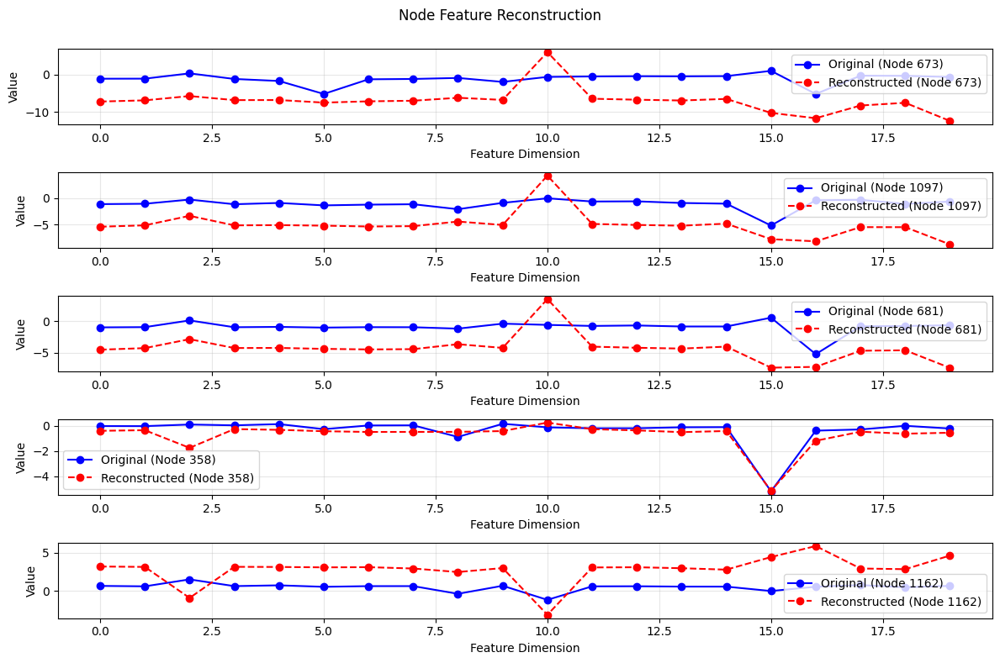

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:00<00:00, 10977.23it/s]


Completed. Cached 10201 / 10201 points.


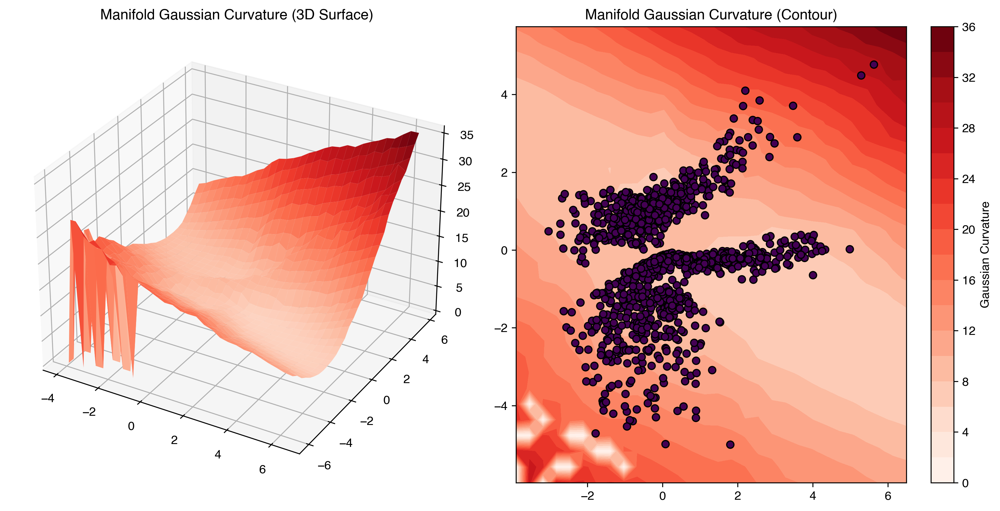

In [11]:
visualize_node_features_reconstruction(model_phase2, single_graph, sample_features=dimP)
with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu2 = model_phase2.encode(x, edge_index=edge_index)

model_phase2.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0])

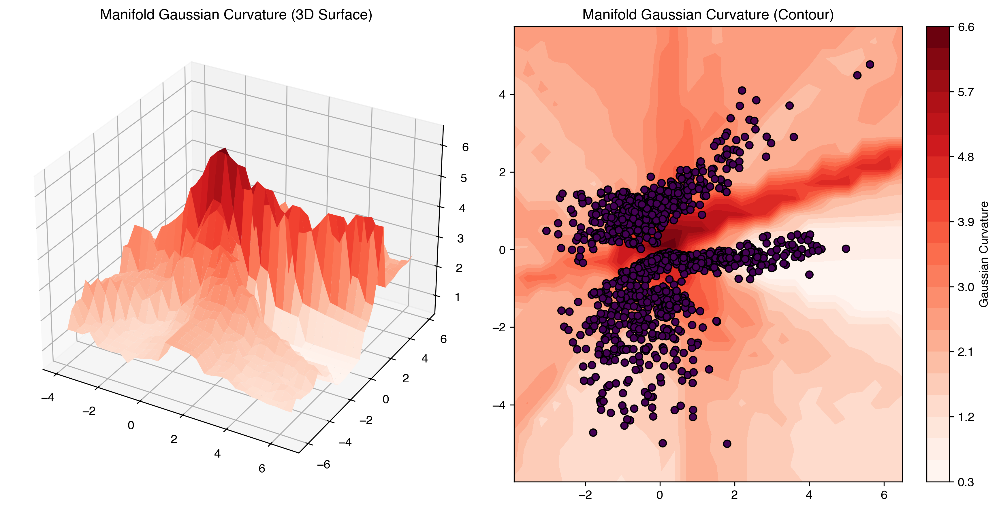

In [12]:
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0])

In [15]:
torch.save(model_phase2.state_dict(), 'model_phase2_reducedIDF.pth')

In [21]:
history_phase2.keys()

dict_keys(['total_loss', 'kl_loss', 'recon_loss', 'decoder_losses', 'detailed_losses'])

In [22]:
# Combine histories
combined_history = {
    "phase1": history_phase1,
    "phase2": history_phase2
}
visualize_training({"recon_loss": history_phase2["recon_loss"], "kl_loss": [], "decoder_losses": {'ref_loss': history_phase2["detailed_losses"]["adj_decoder"]["ref_loss"], 'dyn_loss': history_phase2["detailed_losses"]["adj_decoder"]["base_loss"]}, "total_loss": history_phase2["total_loss"]})

merged_history = {}
for key in history_phase1.keys():
  if isinstance(history_phase1[key], list):
    merged_history[key] = history_phase1[key] + history_phase2[key]
  else:
     merged_history[key] = dict()
     #for key2 in history_phase1[key].keys():
        #merged_history[key][key2] = history_phase1[key][key2] + history_phase2[key][key2]
      
     for key2 in history_phase2[key].keys():
        if key2 not in history_phase1[key].keys():
          merged_history[key][key2] = [np.nan]*len(history_phase1["kl_loss"]) + history_phase2[key][key2]

visualize_training(merged_history)


NameError: name 'history_phase1' is not defined

In [13]:
plt.plot(history_phase2["detailed_losses"]["adj_decoder"]["sigma"])

NameError: name 'history_phase2' is not defined

In [14]:
with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase2 = model_phase2.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase2 = model_phase2.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )
        

Calculating 800745 pairwise Riemannian distances using linear_interpolation_distance (batch mode)...


Computing distances in batches: 100%|██████████| 100094/100094 [00:15<00:00, 6271.68it/s]

Distance matrix calculation complete.


In [17]:
resolution = 30
bounds_np = model_phase1.get_latent_manifold().get_bounds().cpu().numpy()
plot_z1 = np.linspace(bounds_np[0, 0], bounds_np[0, 1], resolution)
plot_z2 = np.linspace(bounds_np[1, 0], bounds_np[1, 1], resolution)

Z1_np, Z2_np = np.meshgrid(plot_z1, plot_z2)
Z1, Z2 = torch.from_numpy(Z1_np), torch.from_numpy(Z2_np)
            
curvature_phase1 = torch.zeros((resolution, resolution))
curvature_phase2 = torch.zeros((resolution, resolution))

            
for i in range(resolution):
    for j in range(resolution):
        z = torch.stack([Z1[i, j], Z2[i, j]])
        clamped_z = model_phase1.get_latent_manifold()._clamp_point_to_bounds(z)
        try:
            curv_val_1 = model_phase1.get_latent_manifold().compute_gaussian_curvature(model_phase1.get_latent_manifold().metric_tensor(clamped_z))
            curvature_phase1[i, j] = curv_val_1
        except (ValueError, RuntimeError) as e:
            print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
            curvature_phase1[i, j] = torch.nan

        try:
            curv_val_2 = model_phase2.get_latent_manifold().compute_gaussian_curvature(model_phase2.get_latent_manifold().metric_tensor(clamped_z))
            curvature_phase2[i, j] = curv_val_2
        except (ValueError, RuntimeError) as e:
            print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
            curvature_phase2[i, j] = torch.nan
        

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_1729/3950165761.py:40: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax1.scatter(points_np[:, 0], points_np[:, 1],  cmap='viridis', edgecolors='k')
/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_1729/3950165761.py:41: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax3.scatter(points_np[:, 0], points_np[:, 1],  cmap='viridis', edgecolors='k')


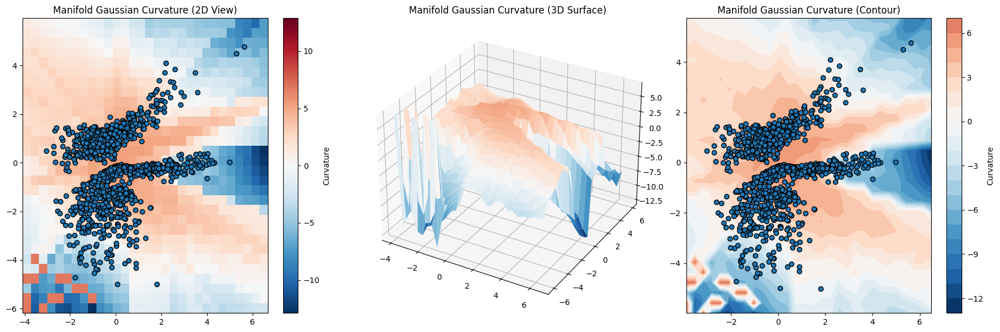

In [20]:
import matplotlib.colors as colors
curvature_diff = (curvature_phase1 - curvature_phase2)/(curvature_phase1 + 1e-8)
curvature_diff = curvature_diff.detach().numpy()

def plot_curv_diff(curvature_diff):
    curvature_diff -= np.mean(curvature_diff)

                
    # --- Plotting Code (using Matplotlib as before) ---
    fig = plt.figure(figsize=(18, 6))
    # ... (The plotting logic is identical, just using the _np versions of arrays)
    vmin, vmax = np.nanmin(curvature_diff), np.nanmax(curvature_diff)
    if np.isnan(vmin) or np.isnan(vmax) or vmin == vmax: vmin, vmax = -1, 1
    if vmin < 0 and vmax > 0:
        absmax = np.max([np.abs(vmax), np.abs(vmin)])
        norm = colors.TwoSlopeNorm(vmin=-absmax, vcenter=0, vmax=absmax)
        cmap = 'RdBu_r'
    elif vmin < 0 and vmax <= 0:
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
        cmap = 'Blues_r'
    else:
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
        cmap = 'Reds'

    ax1 = fig.add_subplot(131)
    im = ax1.pcolormesh(Z1_np, Z2_np, curvature_diff, cmap=cmap, norm=norm, shading='auto')
    ax1.set_title('Manifold Gaussian Curvature (2D View)')
    plt.colorbar(im, ax=ax1, label='Curvature')

    ax2 = fig.add_subplot(132, projection='3d')
    ax2.plot_surface(Z1_np, Z2_np, curvature_diff, cmap=cmap, norm=norm)
    ax2.set_title('Manifold Gaussian Curvature (3D Surface)')

    ax3 = fig.add_subplot(133)
    contour = ax3.contourf(Z1_np, Z2_np, curvature_diff, 20, cmap=cmap, norm=norm)
    ax3.set_title('Manifold Gaussian Curvature (Contour)')
    plt.colorbar(contour, ax=ax3, label='Curvature')

    points_np = latent_points.detach().cpu().numpy()
    ax1.scatter(points_np[:, 0], points_np[:, 1],  cmap='viridis', edgecolors='k')
    ax3.scatter(points_np[:, 0], points_np[:, 1],  cmap='viridis', edgecolors='k')

    plt.tight_layout()
    plt.show()

plot_curv_diff(curvature_diff)


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_1729/3241456288.py:10: RuntimeWarning: invalid value encountered in divide
  res3 = ((local_dists_phase1 - dists_phase2)/local_dists_phase1)


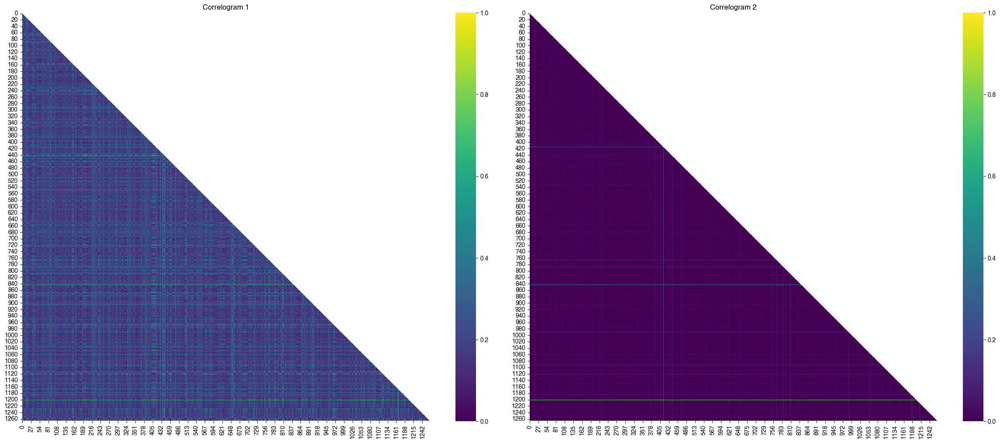

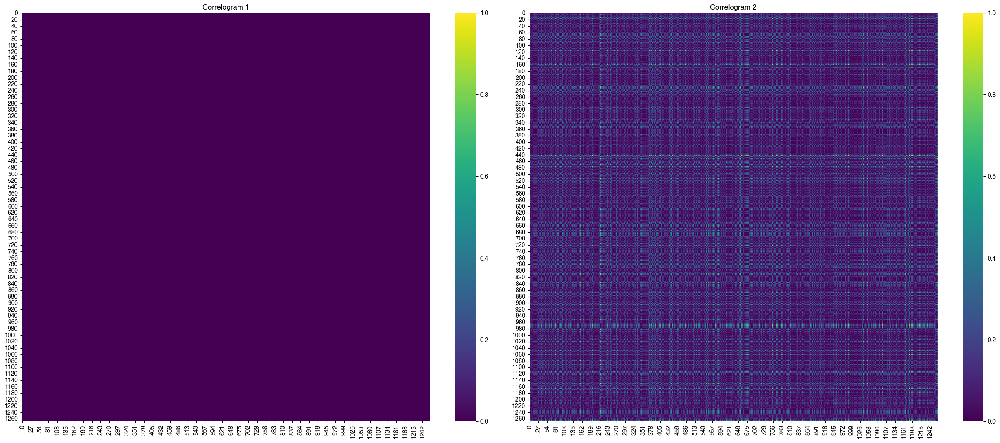

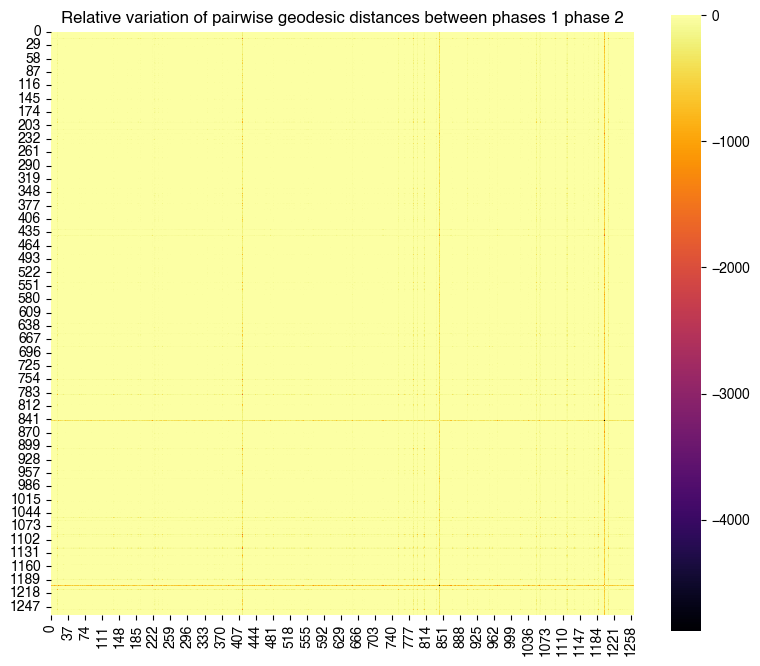

In [21]:
if isinstance(dists_phase1, torch.Tensor):
    dists_phase1 = dists_phase1.detach().numpy()
if isinstance(dists_phase2, torch.Tensor):
    dists_phase2 = dists_phase2.detach().numpy()

local_dists_phase1 = dists_phase1
if distance_mode == "dijkstra":
    local_dists_phase1 = dists_phase1_dijkstra.detach().numpy()
res = np.abs((local_dists_phase1 - dists_phase2))
res3 = ((local_dists_phase1 - dists_phase2)/local_dists_phase1)
#res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)
res3 = np.nan_to_num(res3, 0)

res3_z = (res3 - np.mean(res3))/np.sqrt(np.var(res3))

res2 = np.abs((local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)) - dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0))))

_ = plot_correlogram(local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)), dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0)), remove_diagonal=True, triangular=True)

_ = plot_correlogram((res/np.max(res))**2, (res2/np.max(res2))**2)
_ = plot_correlogram(res3, cmap="inferno", titles=["Relative variation of pairwise geodesic distances between phases 1 phase 2"] )

In [ ]:
for i in [0,2, 4, 5, 9, 10, 11, 14, 15, 16, 17, 18, 19]:
    print(cols_to_norm[i])

NameError: name 'cols_to_norm' is not defined

In [ ]:
x.shape[1]

(1266, 13)

In [22]:
import statsmodels.api as sm

# Knowing that x is:
cols_to_norm = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

x = single_graph.x[:, [0,2, 4, 5, 9, 10, 11, 15, 16, 17, 18, 19]].numpy()
x = sm.add_constant(x)
y = res3_z.sum(axis=1).flatten()

model = sm.OLS(y,x)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.207
Model:                            OLS   Adj. R-squared:                  0.200
Method:                 Least Squares   F-statistic:                     27.29
Date:                Mon, 13 Oct 2025   Prob (F-statistic):           2.17e-55
Time:                        15:22:47   Log-Likelihood:                -10104.
No. Observations:                1266   AIC:                         2.023e+04
Df Residuals:                    1253   BIC:                         2.030e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        135.6094     28.511      4.756      0.0

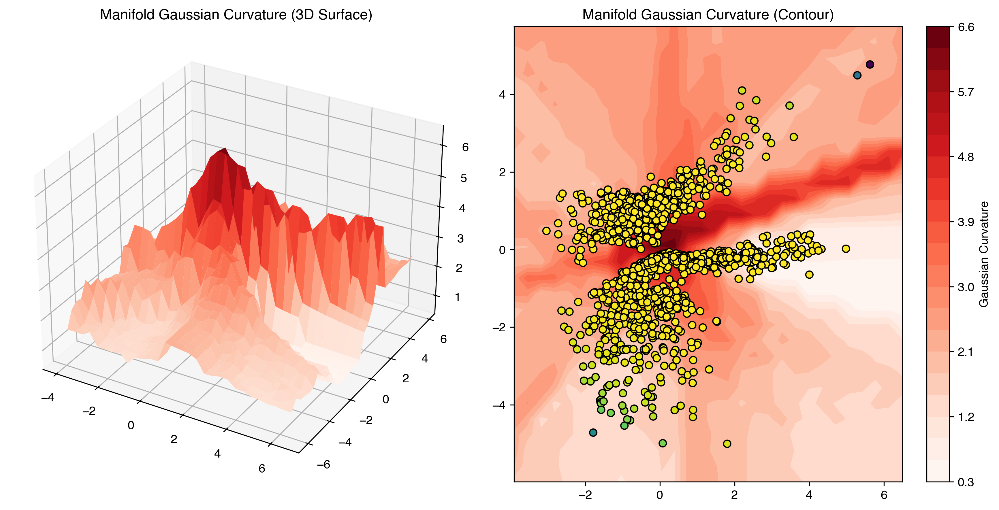

In [23]:
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=(torch.tensor(res3.sum(axis=1))))

In [24]:
import numpy as np

y = res3_z
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle without diagonal
y_pairs = y[pairs]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant from original x
    # build symmetric regressors
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)
X_pairs = sm.add_constant(X_pairs)

model = sm.OLS(y_pairs, X_pairs)
results = model.fit()
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.259
Model:                            OLS   Adj. R-squared:                  0.259
Method:                 Least Squares   F-statistic:                 1.167e+04
Date:                Mon, 13 Oct 2025   Prob (F-statistic):               0.00
Time:                        15:22:59   Log-Likelihood:            -1.0164e+06
No. Observations:              800745   AIC:                         2.033e+06
Df Residuals:                  800720   BIC:                         2.033e+06
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3459      0.003    125.187      0.0

In [25]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

y = res3_z
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle
y_pairs = y[pairs]

# original feature names you actually used
cols = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)

# Build names dynamically
sum_cols = [f"{c}_sum" for c in cols[:X_pairs.shape[1] // 2]]
diff_cols = [f"{c}_absdiff" for c in cols[:X_pairs.shape[1] // 2]]
regressor_names = ["const"] + sum_cols + diff_cols

# Add constant AFTER naming
X_pairs = sm.add_constant(X_pairs)

# Double-check match
assert X_pairs.shape[1] == len(regressor_names), \
    f"Mismatch: {X_pairs.shape[1]} vs {len(regressor_names)}"

# Fit with clustering
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(cov_type="cluster", cov_kwds={"groups": clusters})

print(results.summary(xname=regressor_names))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.259
Model:                            OLS   Adj. R-squared:                  0.259
Method:                 Least Squares   F-statistic:                     74.19
Date:                Mon, 13 Oct 2025   Prob (F-statistic):          2.61e-221
Time:                        15:23:05   Log-Likelihood:            -1.0164e+06
No. Observations:              800745   AIC:                         2.033e+06
Df Residuals:                  800720   BIC:                         2.033e+06
Df Model:                          24                                         
Covariance Type:              cluster                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.3459    

In [26]:
import pandas as pd

# Pairs
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node of the pair

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(
    cov_type="cluster",
    cov_kwds={"groups": clusters}
)

results.summary(xname=regressor_names)

from linearmodels.iv import IV2SLS

df = pd.DataFrame(X_pairs, columns=regressor_names)
df["y"] = y_pairs
df["i"] = i_idx
df["j"] = j_idx

model = IV2SLS.from_formula(
    "y ~ 1 + " + " + ".join(sum_cols + diff_cols),
    data=df
)

# two-way clustering by i and j
res = model.fit(cov_type="clustered", clusters=df[["i", "j"]])
print(res.summary)


                            OLS Estimation Summary                            
Dep. Variable:                      y   R-squared:                      0.2591
Estimator:                        OLS   Adj. R-squared:                 0.2590
No. Observations:              800745   F-statistic:                    315.62
Date:                Mon, Oct 13 2025   P-value (F-stat)                0.0000
Time:                        15:23:16   Distribution:                 chi2(24)
Cov. Estimator:             clustered                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept               0.3459     0.0429     8.0693     0.0000      0.2619      0.4299
p20_pop_sum     

In [27]:
import pandas as pd

def classify_pairwise_regression(results, regressor_names, alpha=0.05):
    """
    Classify pairwise regression coefficients into categories:
    - Convergence drivers
    - Divergence drivers
    - Homophily
    - Heterophily
    Only coefficients with p < alpha are considered significant.
    """

    coef = results.params
    df = pd.DataFrame({
        "regressor": regressor_names,
        "coef": coef,
        "pval": results.pvalues
    })

    # keep only significant variables
    df_sig = df[df["pval"] < alpha]

    categories = {"convergence": [], "divergence": [], "homophily": [], "heterophily": []}

    for _, row in df_sig.iterrows():
        name, c = row["regressor"], row["coef"]

        if name.endswith("_sum"):
            if c > 0:
                categories["convergence"].append((name, c))
            elif c < 0:
                categories["divergence"].append((name, c))

        elif name.endswith("_absdiff"):
            if c > 0:
                categories["heterophily"].append((name, c))
            elif c < 0:
                categories["homophily"].append((name, c))

    # Print with explanations
    print("\nInterpretation of regression results (significant at p < {}):".format(alpha))
    print("• Convergence: positive _sum → larger joint values reduce relative distance.")
    print("• Divergence: negative _sum → larger joint values increase relative distance.")
    print("• Homophily: negative _absdiff → similarity reduces distance.")
    print("• Heterophily: positive _absdiff → dissimilarity reduces distance.\n")

    for cat, vars_ in categories.items():
        if vars_:
            print(f"{cat.capitalize()} drivers:")
            for name, coef in vars_:
                print(f"  - {name}: {coef:.4f}")
            print("")

    return categories, df, df_sig

classify_pairwise_regression(results, regressor_names)


Interpretation of regression results (significant at p < 0.05):
• Convergence: positive _sum → larger joint values reduce relative distance.
• Divergence: negative _sum → larger joint values increase relative distance.
• Homophily: negative _absdiff → similarity reduces distance.
• Heterophily: positive _absdiff → dissimilarity reduces distance.

Convergence drivers:
  - p14_pop_sum: 0.0329
  - superf_sum: 0.4263
  - p20_men_sum: 0.1692
  - p20_rsecocc_sum: 0.0415
  - p20_logvac_sum: 0.1040
  - med20_sum: 0.2317
  - p20_emplt_sum: 0.0964

Divergence drivers:
  - p20_pop_sum: -0.5118
  - p20_log_sum: -0.4860
  - p20_rp_sum: -0.0178

Homophily drivers:
  - p20_pop_absdiff: -0.2250
  - naisd22_absdiff: -0.2318
  - decesd22_absdiff: -0.0153
  - p20_log_absdiff: -0.4416
  - p20_rp_absdiff: -0.0029

Heterophily drivers:
  - superf_absdiff: 0.3102
  - p20_men_absdiff: 0.0687
  - p20_rsecocc_absdiff: 0.0600
  - p20_logvac_absdiff: 0.0508
  - p20_emplt_absdiff: 0.1114



({'convergence': [('p14_pop_sum', 0.03289334254657745),
   ('superf_sum', 0.42628593289246647),
   ('p20_men_sum', 0.16924754768194017),
   ('p20_rsecocc_sum', 0.04154732044874913),
   ('p20_logvac_sum', 0.10396804890124853),
   ('med20_sum', 0.23168057922447718),
   ('p20_emplt_sum', 0.09644298961473699)],
  'divergence': [('p20_pop_sum', -0.5118331471604698),
   ('p20_log_sum', -0.48596538959331037),
   ('p20_rp_sum', -0.017848530879296227)],
  'homophily': [('p20_pop_absdiff', -0.22497492017842305),
   ('naisd22_absdiff', -0.23176598363019024),
   ('decesd22_absdiff', -0.015289442761527511),
   ('p20_log_absdiff', -0.4415846403792496),
   ('p20_rp_absdiff', -0.0028861938165081944)],
  'heterophily': [('superf_absdiff', 0.31020701900291203),
   ('p20_men_absdiff', 0.0686790710478499),
   ('p20_rsecocc_absdiff', 0.06003034832725359),
   ('p20_logvac_absdiff', 0.05082781432548758),
   ('p20_emplt_absdiff', 0.11135607396390033)]},
               regressor      coef          pval
 0     

In [ ]:
torch.save(model_phase1.state_dict(), 'model_phase1_geo.pth')
torch.save(model_phase1.state_dict(), 'model_phase2_geo.pth')


### Original distances

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm


y = adjacency_matrix
x = p_vectors_array[:, [0,2, 4, 5, 9, 10, 11, 15, 16, 17, 18, 19]]
x = sm.add_constant(x)
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle
y_pairs = y[pairs]

# original feature names you actually used
cols = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)

# Build names dynamically
sum_cols = [f"{c}_sum" for c in cols[:X_pairs.shape[1] // 2]]
diff_cols = [f"{c}_absdiff" for c in cols[:X_pairs.shape[1] // 2]]
regressor_names = ["const"] + sum_cols + diff_cols

# Add constant AFTER naming
X_pairs = sm.add_constant(X_pairs)

# Double-check match
assert X_pairs.shape[1] == len(regressor_names), \
    f"Mismatch: {X_pairs.shape[1]} vs {len(regressor_names)}"

# Fit with clustering
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(cov_type="cluster", cov_kwds={"groups": clusters})

print(results.summary(xname=regressor_names))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     5.412
Date:                Thu, 25 Sep 2025   Prob (F-statistic):           1.39e-15
Time:                        17:57:05   Log-Likelihood:             2.8533e+06
No. Observations:              800745   AIC:                        -5.707e+06
Df Residuals:                  800720   BIC:                        -5.706e+06
Df Model:                          24                                         
Covariance Type:              cluster                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0004   5

In [ ]:
import pandas as pd

# Pairs
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node of the pair

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(
    cov_type="cluster",
    cov_kwds={"groups": clusters}
)

results.summary(xname=regressor_names)

from linearmodels.iv import IV2SLS

df = pd.DataFrame(X_pairs, columns=regressor_names)
df["y"] = y_pairs
df["i"] = i_idx
df["j"] = j_idx

model = IV2SLS.from_formula(
    "y ~ 1 + " + " + ".join(sum_cols + diff_cols),
    data=df
)

# two-way clustering by i and j
res = model.fit(cov_type="clustered", clusters=df[["i", "j"]])
print(res.summary)

                            OLS Estimation Summary                            
Dep. Variable:                      y   R-squared:                      0.0031
Estimator:                        OLS   Adj. R-squared:                 0.0031
No. Observations:              800745   F-statistic:                    115.83
Date:                Thu, Sep 25 2025   P-value (F-stat)                0.0000
Time:                        17:58:24   Distribution:                 chi2(24)
Cov. Estimator:             clustered                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept               0.0004  7.647e-05     4.8853     0.0000      0.0002      0.0005
p20_pop_sum     

In [ ]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

class PlotlyNodeViewer:
    def __init__(self, single_graph, model_phase1, latent_points, names):
        self.single_graph = single_graph
        self.model_phase1 = model_phase1
        self.latent_points = latent_points
        self.names = names
        self.num_nodes = len(names)
        
        # Create subplot figure
        self.fig = make_subplots(
            rows=1, cols=2,
            subplot_titles=('Node Reconstruction', 'Points on Manifold - Click to Select'),
            horizontal_spacing=0.1
        )
        
        # Initial selected index
        self.selected_idx = 0
        
        # Add manifold scatter plot
        points_np = self.latent_points.detach().cpu().numpy()
        
        self.fig.add_trace(
            go.Scatter(
                x=points_np[:, 0],
                y=points_np[:, 1],
                mode='markers',
                marker=dict(size=8, color='lightblue', line=dict(width=1, color='black')),
                text=[f"{i}: {name}" for i, name in enumerate(self.names)],
                hovertemplate='<b>%{text}</b><br>X: %{x:.3f}<br>Y: %{y:.3f}<extra></extra>',
                name='Nodes'
            ),
            row=1, col=2
        )
        
        # Highlight selected point
        self.fig.add_trace(
            go.Scatter(
                x=[points_np[0, 0]],
                y=[points_np[0, 1]],
                mode='markers',
                marker=dict(size=12, color='red', line=dict(width=2, color='darkred')),
                name='Selected',
                showlegend=False
            ),
            row=1, col=2
        )
        
        # Add initial reconstruction
        self.update_reconstruction(0)
        
        # Set up click callback
        self.fig.data[0].on_click(self.on_click)
        
        # Update layout
        self.fig.update_layout(
            title='Interactive Node Reconstruction Viewer',
            height=500,
            showlegend=True
        )
        
        self.fig.show()
    
    def on_click(self, trace, points, selector):
        """Handle click events on scatter plot"""
        if points.point_inds:
            self.selected_idx = points.point_inds[0]
            
            # Update highlight position
            points_np = self.latent_points.detach().cpu().numpy()
            self.fig.data[1].x = [points_np[self.selected_idx, 0]]
            self.fig.data[1].y = [points_np[self.selected_idx, 1]]
            
            # Update reconstruction
            self.update_reconstruction(self.selected_idx)
    
    def update_reconstruction(self, idx):
        """Update reconstruction plot"""
        # Get original and reconstructed data
        a = self.single_graph.x[idx]
        a_r = self.model_phase1(self.single_graph.x[idx].unsqueeze(0))
        
        original = a.detach().cpu().numpy()
        reconstructed = a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze().cpu().numpy()
        
        # Remove existing reconstruction traces if any
        traces_to_remove = []
        for i, trace in enumerate(self.fig.data):
            if trace.name in ['Original', 'Reconstructed']:
                traces_to_remove.append(i)
        
        for i in reversed(traces_to_remove):
            self.fig.data = self.fig.data[:i] + self.fig.data[i+1:]
        
        # Add new reconstruction traces
        x_vals = list(range(len(original)))
        
        self.fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=original,
                mode='lines+markers',
                name='Original',
                line=dict(color='blue', width=2),
                marker=dict(size=6)
            ),
            row=1, col=1
        )
        
        self.fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=reconstructed,
                mode='lines+markers',
                name='Reconstructed',
                line=dict(color='orange', width=2, dash='dash'),
                marker=dict(size=6, symbol='square')
            ),
            row=1, col=1
        )
        
        # Update subplot title
        self.fig.layout.annotations[0].text = f'Reconstruction: {idx} - {self.names[idx]}'


# Even simpler version using Plotly widgets
def create_simple_plotly_viewer(single_graph, model_phase1, latent_points, names):
    """Simple function-based approach"""
    import ipywidgets as widgets
    from IPython.display import display
    
    def plot_reconstruction(idx):
        # Get data
        a = single_graph.x[idx]
        a_r = model_phase1(single_graph.x[idx].unsqueeze(0))
        
        original = a.detach().cpu().numpy()
        reconstructed = a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze().cpu().numpy()
        points_np = latent_points.detach().cpu().numpy()
        
        # Create subplots
        fig = make_subplots(
            rows=1, cols=2,
            subplot_titles=(f'Reconstruction: {idx} - {names[idx]}', 'Points on Manifold')
        )
        
        # Reconstruction plot
        x_vals = list(range(len(original)))
        fig.add_trace(
            go.Scatter(x=x_vals, y=original, mode='lines+markers', 
                      name='Original', line=dict(color='blue')),
            row=1, col=1
        )
        fig.add_trace(
            go.Scatter(x=x_vals, y=reconstructed, mode='lines+markers',
                      name='Reconstructed', line=dict(color='orange', dash='dash')),
            row=1, col=1
        )
        
        # Manifold plot with highlight
        colors = ['red' if i == idx else 'lightblue' for i in range(len(points_np))]
        sizes = [12 if i == idx else 8 for i in range(len(points_np))]
        
        fig.add_trace(
            go.Scatter(
                x=points_np[:, 0], y=points_np[:, 1],
                mode='markers',
                marker=dict(size=sizes, color=colors, line=dict(width=1, color='black')),
                text=[f"{i}: {name}" for i, name in enumerate(names)],
                hovertemplate='<b>%{text}</b><br>X: %{x:.3f}<br>Y: %{y:.3f}<extra></extra>',
                showlegend=False
            ),
            row=1, col=2
        )
        
        fig.update_layout(height=500, title='Node Reconstruction Viewer')
        fig.show()
    
    # Create slider widget
    slider = widgets.IntSlider(
        value=0,
        min=0,
        max=len(names)-1,
        step=1,
        description='Node:',
        continuous_update=False
    )
    
    # Create interactive widget
    interactive_plot = widgets.interactive(plot_reconstruction, idx=slider)
    display(interactive_plot)
    
    return interactive_plot

# Usage:
# Method 1 - Click-based (more advanced):
#viewer = PlotlyNodeViewer(single_graph, model_phase1, latent_points, names)

# Method 2 - Slider-based (simpler, guaranteed to work):
interactive_plot = create_simple_plotly_viewer(single_graph, model_phase1, latent_points, names)

interactive(children=(IntSlider(value=0, continuous_update=False, description='Node:', max=1265), Output()), _…